# Pix2Pix GAN

In this notebook we create and train a generative model based on the paper [*Image-to-Image Translation with Conditional Adversarial Networks*](https://arxiv.org/abs/1611.07004) by Isola et al. 2017, also known as Pix2Pix, which is a type of conditional GAN, or cGAN.



## Dataset

We will use the face image and coressponding face edges from our data folder. Add more info latter.

## Goals

For this notebook I will:
1.   Implement the loss of a Pix2Pix model that differentiates it from a supervised U-Net.
2.   Observe the change in generator priorities as the Pix2Pix generator trains, changing its emphasis from reconstruction to realism.

<!-- 1. Exploratory Data Analysis 
2. Train the Gaussian NB model called gaussianNB_clf.
3. Analyze Model Performance 
4. Evaluate the model on Test Data
5. Written Report -->

## Import Libraries and Load data

In [1]:
#Run THIS if your training on GPU 
!nvidia-smi --query-gpu=gpu_name,driver_version,memory.total --format=csv

In [2]:
# VERSION = "nightly" #@param ["20200220", "nightly", "xrt==1.15.0"]
# !curl https://raw.githubusercontent.com/pytorch/xla/master/contrib/scripts/env-setup.py -o pytorch-xla-env-setup.py
# # !python pytorch-xla-env-setup.py --version $VERSION
# !python pytorch-xla-env-setup.py --apt-packages libomp5 libopenblas-dev

In [3]:
import torch, helper, os
# # imports the torch_xla package
# import torch_xla
# import torch_xla.core.xla_model as xm


In [4]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

corpus = os.path.join("/content/gdrive/My Drive/", "face-data")


Mounted at /content/gdrive


In [5]:
from torch import nn
from tqdm.auto import tqdm
from torchvision import datasets, transforms
from torchvision.utils import make_grid, save_image
from torch.utils.data import DataLoader
import torch.nn.functional as F
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

torch.manual_seed(0)

# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

# IMAGE_PATH = '../input/face-class-data/class/'
IMAGE_PATH = corpus
SAMPLE_PATH = '../'

if not os.path.exists(SAMPLE_PATH):
    os.makedirs(SAMPLE_PATH)

# We transform the data to tensors and resize them to desired size (O(1) operation)
def load_data_sets(data_dir,batch_size):
    transform = transforms.Compose([transforms.Resize(256),
                                    transforms.ToTensor()])
    dataset = datasets.ImageFolder(data_dir, transform=transform)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

#     images, labels = next(iter(dataloader))
    # helper.imshow(images[0], normalize=False)
    return dataloader

def show_tensor_images(image_tensor, num_images=25, size=(3, 256, 256)):
    image_shifted = image_tensor
    image_unflat = image_shifted.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

## U-Net 
[U-Net: Convolutional Networks for Biomedical Image Segmentation](https://arxiv.org/abs/1505.04597), by Ronneberger et al. 2015

Images are first fed through many convolutional layers which reduce height and width while increasing the channels (contracting path) For example, a set of two 2 x 2 convolutions with a stride of 2, will take a 1 x 28 x 28 (channels, height, width) grayscale image and result in a 2 x 14 x 14 representation. The "expanding path" does the opposite, gradually growing the image with fewer and fewer channels.

### Contracting Path
The contracting path is the encoder section of the U-Net, which has several downsampling steps as part of it. The authors give more detail of the remaining parts in the following paragraph from the paper (Renneberger, 2015):

    The contracting path follows the typical architecture of a convolutional network. It consists of the repeated application of two 3 x 3 convolutions (unpadded convolutions), each followed by a rectified linear unit (ReLU) and a 2 x 2 max pooling operation with stride 2 for downsampling. At each downsampling step we double the number of feature channels.



In [6]:
class ContractingBlock(nn.Module):
    '''
    ContractingBlock Class
    Performs two convolutions followed by a max pool operation.
    Values:
        input_channels: the number of channels to expect from a given input
    '''
    def __init__(self, input_channels, use_dropout=False, use_bn=True):
        super(ContractingBlock, self).__init__()
        # We want to double the number of channels in the first convolution
        # and keep the same number of channels in the second.
        self.conv1 = nn.Conv2d(input_channels, input_channels * 2, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(input_channels * 2, input_channels * 2, kernel_size=3, padding=1)
        self.activation = nn.LeakyReLU(0.2)
        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)
        if use_bn:
            self.batchnorm = nn.BatchNorm2d(input_channels * 2)
        self.use_bn = use_bn
        if use_dropout:
            self.dropout = nn.Dropout()
        self.use_dropout = use_dropout

    def forward(self, x):
        '''
        Function for completing a forward pass of ContractingBlock: 
        Given an image tensor, completes a contracting block and returns the transformed tensor.
        Parameters:
            x: image tensor of shape (batch size, channels, height, width)
        '''
        x = self.conv1(x)
        if self.use_bn:
            x = self.batchnorm(x)
        if self.use_dropout:
            x = self.dropout(x)
        x = self.activation(x)   
        x = self.conv2(x)
        if self.use_bn:
            x = self.batchnorm(x)
        if self.use_dropout:
            x = self.dropout(x)
        x = self.activation(x)
        x = self.maxpool(x)
        return x

### Expanding Path
The expanding blocks for the expanding path is the decoding section of U-Net which has several upsampling steps as part of it. In order to do this, you'll also need to write a crop function. This is so you can crop the image from the contracting path and concatenate it to the current image on the expanding path—this is to form a skip connection. Again, the details are from the paper (Renneberger, 2015):

    Every step in the expanding path consists of an upsampling of the feature map followed by a 2 x 2 convolution (“up-convolution”) that halves the number of feature channels, a concatenation with the correspondingly cropped feature map from the contracting path, and two 3 x 3 convolutions, each followed by a ReLU. The cropping is necessary due to the loss of border pixels in every convolution.

In [7]:
def crop(image, new_shape):
    '''
    Function for cropping an image tensor: Given an image tensor and the new shape,
    crops to the center pixels (assumes that the input's size and the new size are
    even numbers).
    Parameters:
        image: image tensor of shape (batch size, channels, height, width)
        new_shape: a torch.Size object with the shape you want x to have
    '''
    middle_height = image.shape[2] // 2
    middle_width = image.shape[3] // 2
    starting_height = middle_height - new_shape[2] // 2
    final_height = starting_height + new_shape[2]
    starting_width = middle_width - new_shape[3] // 2
    final_width = starting_width + new_shape[3]
    cropped_image = image[:, :, starting_height:final_height, starting_width:final_width]
    return cropped_image

In [8]:
class ExpandingBlock(nn.Module):
    '''
    ExpandingBlock Class:
    Performs an upsampling, a convolution, a concatenation of its two inputs,
    followed by two more convolutions with optional dropout
    Values:
        input_channels: the number of channels to expect from a given input
    '''
    def __init__(self, input_channels, use_dropout=False, use_bn=True):
        super(ExpandingBlock, self).__init__()
        # Every step in the expanding path consists of an upsampling of the feature map
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        # "followed by a 2x2 convolution that halves the number of feature channels"
        # "a concatenation with the correspondingly cropped feature map from the contracting path"
        # "and two 3x3 convolutions"
        self.conv1 = nn.Conv2d(input_channels, input_channels // 2, kernel_size=2)
        self.conv2 = nn.Conv2d(input_channels, input_channels // 2, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(input_channels // 2, input_channels // 2, kernel_size=2, padding=1)
        if use_bn:
            self.batchnorm = nn.BatchNorm2d(input_channels // 2)
        self.use_bn = use_bn
        self.activation = nn.ReLU()
        if use_dropout:
            self.dropout = nn.Dropout()
        self.use_dropout = use_dropout

    def forward(self, x, skip_con_x):
        '''
        Function for completing a forward pass of ExpandingBlock: 
        Given an image tensor, completes an expanding block and returns the transformed tensor.
        Parameters:
            x: image tensor of shape (batch size, channels, height, width)
            skip_con_x: the image tensor from the contracting path (from the opposing block of x)
                    for the skip connection
        '''
        x = self.upsample(x)
        x = self.conv1(x)
        skip_con_x = crop(skip_con_x, x.shape)
        x = torch.cat([x, skip_con_x], axis=1)
        x = self.conv2(x)
        if self.use_bn:
            x = self.batchnorm(x)
        if self.use_dropout:
            x = self.dropout(x)
        x = self.activation(x)
        x = self.conv3(x)
        if self.use_bn:
            x = self.batchnorm(x)
        if self.use_dropout:
            x = self.dropout(x)
        x = self.activation(x)
        return x

### Final Layer
The final feature mapping block, takes in a tensor with arbitrarily many tensors and produces a tensor with the same number of pixels but with the correct number of output channels. From the paper (Renneberger, 2015):

    At the final layer a 1x1 convolution is used to map each 64-component feature vector to the desired number of classes. In total the network has 23 convolutional layers.

In [9]:
class FeatureMapBlock(nn.Module):
    '''
    FeatureMapBlock Class
    The final layer of a U-Net - 
    maps each pixel to a pixel with the correct number of output dimensions
    using a 1x1 convolution.
    Values:
        input_channels: the number of channels to expect from a given input
        output_channels: the number of channels to expect for a given output
    '''
    def __init__(self, input_channels, output_channels):
        super(FeatureMapBlock, self).__init__()
        # Every step in the expanding path consists of an upsampling of the feature map
        self.conv = nn.Conv2d(input_channels, output_channels, kernel_size=1)

    def forward(self, x):
        x = self.conv(x)
        return x

### U-Net

In [10]:
class UNet(nn.Module):
    '''
    UNet Class
    A series of 4 contracting blocks followed by 4 expanding blocks to 
    transform an input image into the corresponding paired image, with an upfeature
    layer at the start and a downfeature layer at the end.
    Values:
        input_channels: the number of channels to expect from a given input
        output_channels: the number of channels to expect for a given output
    '''
    def __init__(self, input_channels, output_channels, hidden_channels=32):
        super(UNet, self).__init__()
        self.upfeature = FeatureMapBlock(input_channels, hidden_channels)
        self.contract1 = ContractingBlock(hidden_channels, use_dropout=True)
        self.contract2 = ContractingBlock(hidden_channels * 2, use_dropout=True)
        self.contract3 = ContractingBlock(hidden_channels * 4, use_dropout=True)
        self.contract4 = ContractingBlock(hidden_channels * 8)
        self.contract5 = ContractingBlock(hidden_channels * 16)
        self.contract6 = ContractingBlock(hidden_channels * 32)
        self.expand0 = ExpandingBlock(hidden_channels * 64)
        self.expand1 = ExpandingBlock(hidden_channels * 32)
        self.expand2 = ExpandingBlock(hidden_channels * 16)
        self.expand3 = ExpandingBlock(hidden_channels * 8)
        self.expand4 = ExpandingBlock(hidden_channels * 4)
        self.expand5 = ExpandingBlock(hidden_channels * 2)
        self.downfeature = FeatureMapBlock(hidden_channels, output_channels)
        self.sigmoid = torch.nn.Sigmoid()

    def forward(self, x):
        '''
        Function for completing a forward pass of UNet: 
        Given an image tensor, passes it through U-Net and returns the output.
        Parameters:
            x: image tensor of shape (batch size, channels, height, width)
        '''
        x0 = self.upfeature(x)
        x1 = self.contract1(x0)
        x2 = self.contract2(x1)
        x3 = self.contract3(x2)
        x4 = self.contract4(x3)
        x5 = self.contract5(x4)
        x6 = self.contract6(x5)
        # Keep in mind that the expand function takes two inputs, 
        # both with the same number of channels. 
        x7 = self.expand0(x6, x5)
        x8 = self.expand1(x7, x4)
        x9 = self.expand2(x8, x3)
        x10 = self.expand3(x9, x2)
        x11 = self.expand4(x10, x1)
        x12 = self.expand5(x11, x0)
        xn = self.downfeature(x12)
        return self.sigmoid(xn)

## PatchGAN Discriminator

The discriminator based on the contracting path of the U-Net evaluates the realism of the generated images. The discriminator outputs a one-channel matrix of classifications instead of a single value. The discriminator's final layer will simply map from the final number of hidden channels to a single prediction for every pixel of the layer before it.

In [11]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Structured like the contracting path of the U-Net, the discriminator will
    output a matrix of values classifying corresponding portions of the image as real or fake. 
    Parameters:
        input_channels: the number of image input channels
        hidden_channels: the initial number of discriminator convolutional filters
    '''
    def __init__(self, input_channels, hidden_channels=8):
        super(Discriminator, self).__init__()
        self.upfeature = FeatureMapBlock(input_channels, hidden_channels)
        self.contract1 = ContractingBlock(hidden_channels, use_bn=False)
        self.contract2 = ContractingBlock(hidden_channels * 2)
        self.contract3 = ContractingBlock(hidden_channels * 4)
        self.contract4 = ContractingBlock(hidden_channels * 8)
        self.final = nn.Conv2d(hidden_channels * 16, 1, kernel_size=1)

    def forward(self, x, y):
        x = torch.cat([x, y], axis=1)
        x0 = self.upfeature(x)
        x1 = self.contract1(x0)
        x2 = self.contract2(x1)
        x3 = self.contract3(x2)
        x4 = self.contract4(x3)
        xn = self.final(x4)
        return xn

## Training Preparation
Parameters needed to be set in order to train correctly:
  *   **real_dim**: the number of channels of the real image and the number expected in the output image
  *   **adv_criterion**: an adversarial loss function to keep track of how well the GAN is fooling the discriminator and how well the discriminator is catching the GAN
  *   **recon_criterion**: a loss function that rewards similar images to the ground truth, which "reconstruct" the image
  *   **lambda_recon**: a parameter for how heavily the reconstruction loss should be weighed
  *   **n_epochs**: the number of times you iterate through the entire dataset when training
  *   **input_dim**: the number of channels of the input image
  *   **display_step**: how often to display/visualize the images
  *   **batch_size**: the number of images per forward/backward pass
  *   **lr**: the learning rate
  *   **target_shape**: the size of the output image (in pixels)
  *   **device**: the device type

In [12]:
real_dim = 3
adv_criterion = nn.BCEWithLogitsLoss() 
recon_criterion = nn.L1Loss() 
lambda_recon = 200
n_epochs = 101 
input_dim = 3
display_step = 200
batch_size = 4
lr = 0.0002
target_shape = 256
device = 'cuda' if torch.cuda.is_available() else 'cpu'
# Creates a random tensor on xla:1 (a Cloud TPU core)
# device = xm.xla_device()
# device = 'cuda' # use 'cuda' if this is running on a gpu else "cpu"

Initialize the generator (U-Net) and discriminator, as well as their optimizers.

In [13]:
gen = UNet(input_dim, real_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator(input_dim + real_dim).to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)

pretrained = True
if pretrained:
    images_dir = '/content/gdrive/My Drive/PIX2PIX DATA'
    loaded_state = torch.load(f"{images_dir}/pix2pix_1600.pth")
    gen.load_state_dict(loaded_state["gen"])
    gen_opt.load_state_dict(loaded_state["gen_opt"])
    disc.load_state_dict(loaded_state["disc"])
    disc_opt.load_state_dict(loaded_state["disc_opt"])
else:
    gen = gen.apply(weights_init)
    disc = disc.apply(weights_init)

In [14]:
def get_gen_loss(gen, disc, real, condition, adv_criterion, recon_criterion, lambda_recon):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator; takes the condition and returns potential images
        disc: the discriminator; takes images and the condition and
          returns real/fake prediction matrices
        real: the real images (e.g. maps) to be used to evaluate the reconstruction
        condition: the source images (e.g. satellite imagery) which are used to produce the real images
        adv_criterion: the adversarial loss function; takes the discriminator 
                  predictions and the true labels and returns a adversarial 
                  loss (which you aim to minimize)
        recon_criterion: the reconstruction loss function; takes the generator 
                    outputs and the real images and returns a reconstructuion 
                    loss (which you aim to minimize)
        lambda_recon: the degree to which the reconstruction loss should be weighted in the sum
    '''
    # Steps: 1) Generate the fake images, based on the conditions.
    #        2) Evaluate the fake images and the condition with the discriminator.
    #        3) Calculate the adversarial and reconstruction losses.
    #        4) Add the two losses, weighting the reconstruction loss appropriately.
    fake = gen(condition)
    disc_fake_hat = disc(fake, condition)
    gen_adv_loss = adv_criterion(disc_fake_hat, torch.ones_like(disc_fake_hat))
    gen_rec_loss = recon_criterion(real, fake)
    gen_loss = gen_adv_loss + lambda_recon * gen_rec_loss
    return gen_loss

## Pix2Pix Training

Finally, you can train the model and see some of your maps!

In [15]:
losses_g = [] # to store generator loss after each epoch
losses_d = [] # to store discriminator loss after each epoch

Pretrained initial state


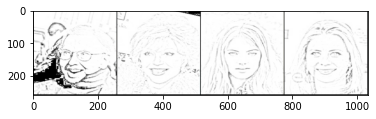

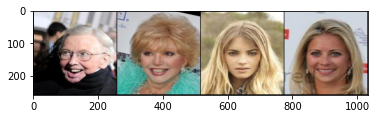

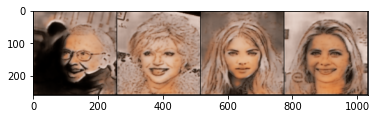

Epoch 0: Step 200: Generator (U-Net) loss: 24.931873826980574, Discriminator loss: 0.3026769739575684


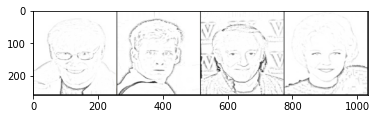

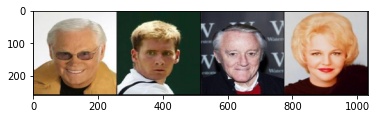

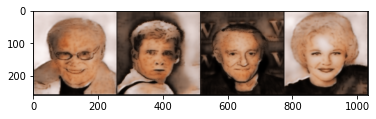

Epoch 0: Step 400: Generator (U-Net) loss: 24.358726449012753, Discriminator loss: 0.41965481596067533


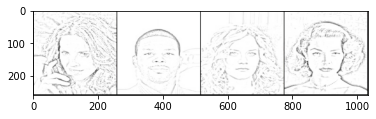

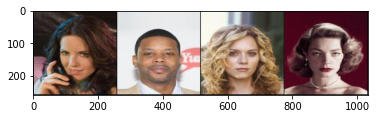

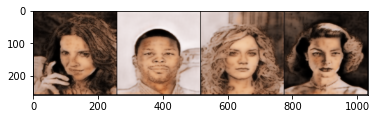

Epoch 1: Step 600: Generator (U-Net) loss: 23.57078135490417, Discriminator loss: 0.34998921597376437


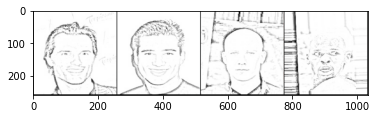

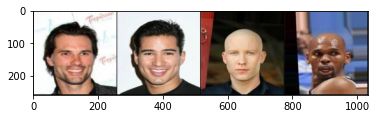

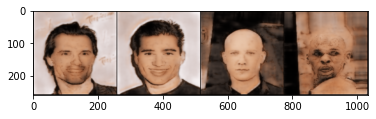

Epoch 1: Step 800: Generator (U-Net) loss: 24.324424419403083, Discriminator loss: 0.3337103341892362


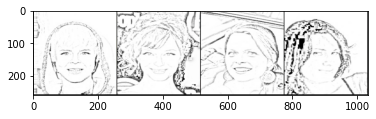

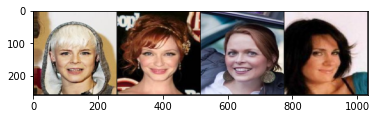

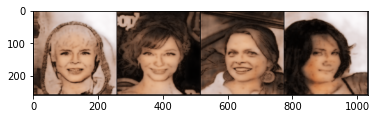

Epoch 2: Step 1000: Generator (U-Net) loss: 23.12871125221251, Discriminator loss: 0.46242582552135003


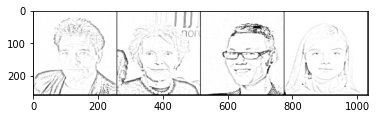

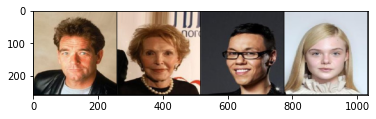

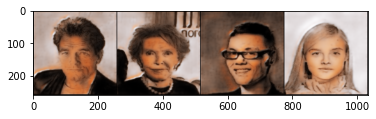

Epoch 2: Step 1200: Generator (U-Net) loss: 23.905507593154912, Discriminator loss: 0.32187662217766067


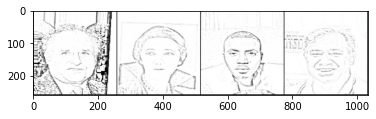

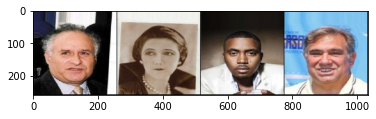

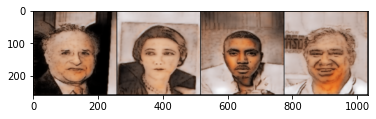

Epoch 2: Step 1400: Generator (U-Net) loss: 23.291429996490475, Discriminator loss: 0.4173216731287538


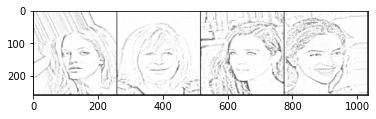

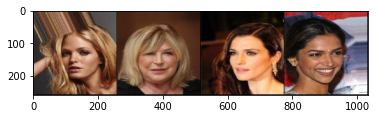

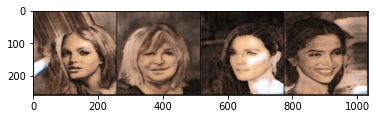

Epoch 3: Step 1600: Generator (U-Net) loss: 21.49703566551208, Discriminator loss: 0.6588663040101529


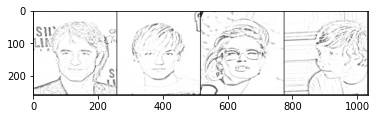

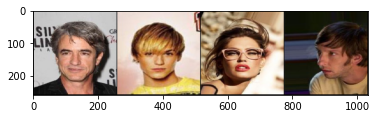

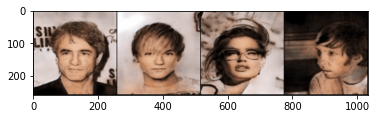

Epoch 3: Step 1800: Generator (U-Net) loss: 23.05994737625121, Discriminator loss: 0.37758480263873917


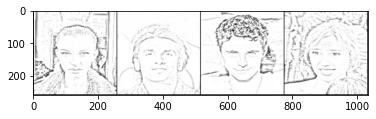

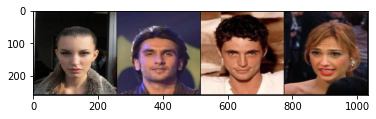

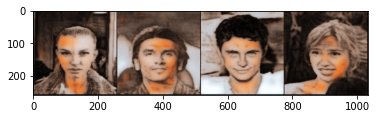

Epoch 4: Step 2000: Generator (U-Net) loss: 22.732473874092115, Discriminator loss: 0.3942864130064845


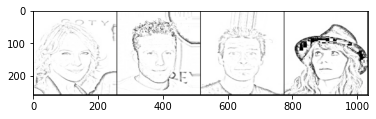

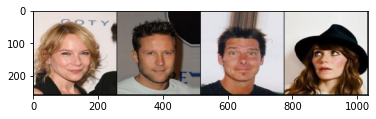

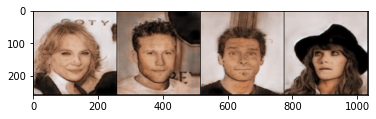

Epoch 4: Step 2200: Generator (U-Net) loss: 22.579735994338996, Discriminator loss: 0.5393445556983351


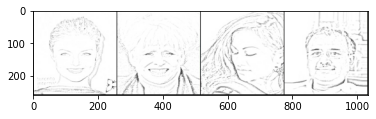

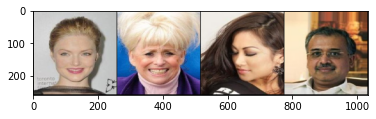

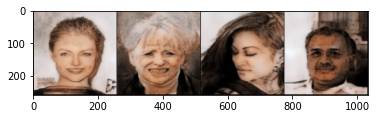

Epoch 4: Step 2400: Generator (U-Net) loss: 21.71227996349333, Discriminator loss: 0.693021973073483


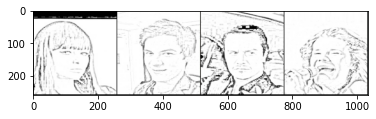

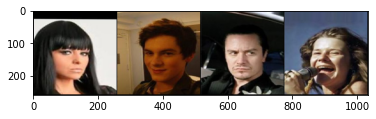

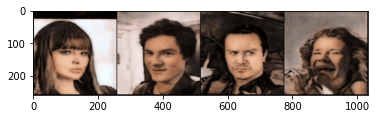

Epoch 5: Step 2600: Generator (U-Net) loss: 20.98588445663452, Discriminator loss: 0.689977658987045


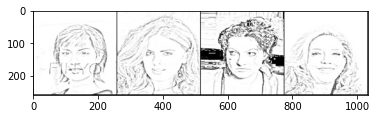

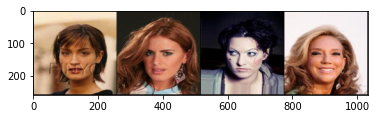

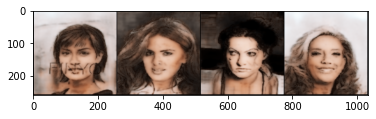

Epoch 5: Step 2800: Generator (U-Net) loss: 21.506564421653746, Discriminator loss: 0.5792710998654368


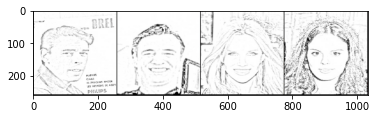

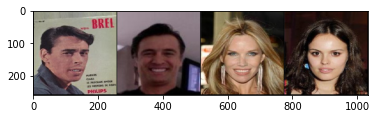

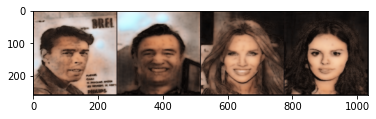

Epoch 6: Step 3000: Generator (U-Net) loss: 21.700913562774648, Discriminator loss: 0.5839924084395172


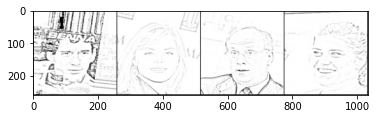

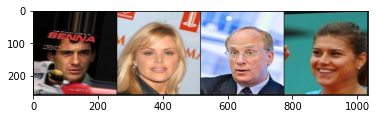

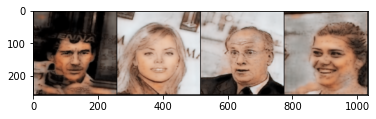

Epoch 6: Step 3200: Generator (U-Net) loss: 21.14657886981965, Discriminator loss: 0.5677667796611786


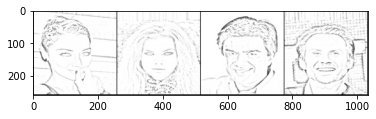

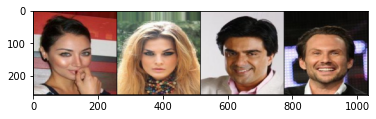

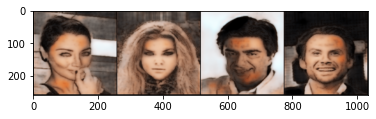

Epoch 6: Step 3400: Generator (U-Net) loss: 21.381795063018796, Discriminator loss: 0.5750808633863929


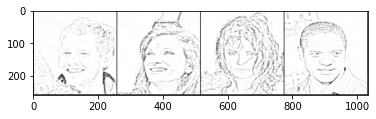

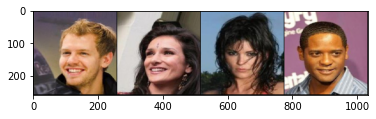

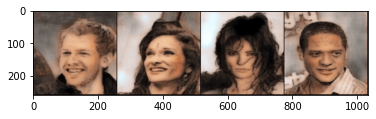

Epoch 7: Step 3600: Generator (U-Net) loss: 20.776557369232176, Discriminator loss: 0.523854738771916


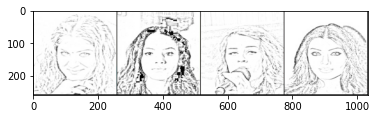

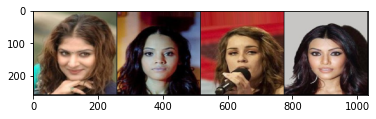

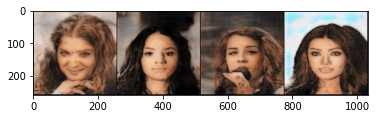

Epoch 7: Step 3800: Generator (U-Net) loss: 21.17468862056732, Discriminator loss: 0.4680260115116836


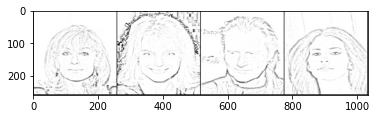

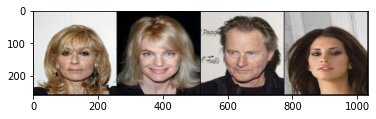

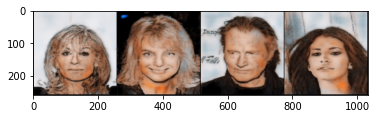

Epoch 8: Step 4000: Generator (U-Net) loss: 21.468515138626106, Discriminator loss: 0.5512472609430555


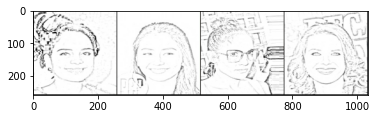

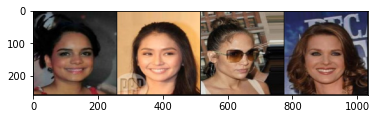

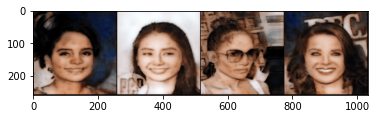

Epoch 8: Step 4200: Generator (U-Net) loss: 20.56988214969635, Discriminator loss: 0.5944954390823841


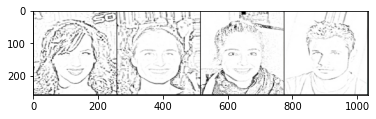

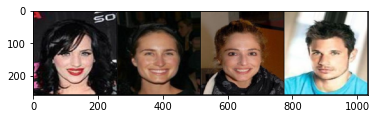

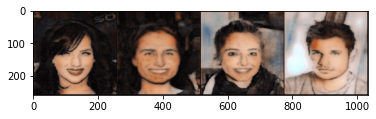

Epoch 8: Step 4400: Generator (U-Net) loss: 21.203456902503962, Discriminator loss: 0.5464565573632714


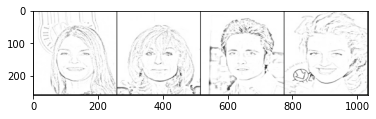

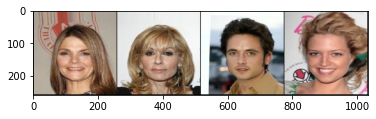

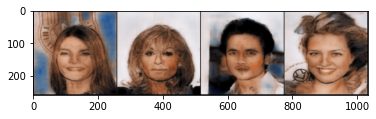

Epoch 9: Step 4600: Generator (U-Net) loss: 21.64758738040923, Discriminator loss: 0.5075690429657698


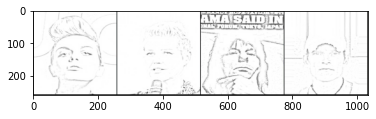

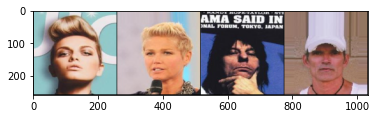

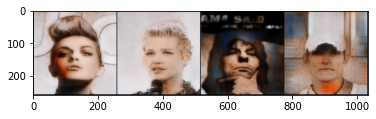

Epoch 9: Step 4800: Generator (U-Net) loss: 20.597788343429567, Discriminator loss: 0.561960376650095


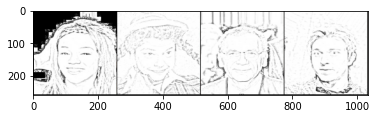

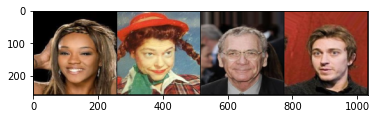

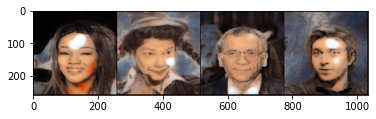

Epoch 10: Step 5000: Generator (U-Net) loss: 21.222832479476928, Discriminator loss: 0.5143653831630944


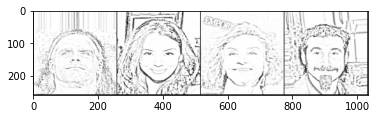

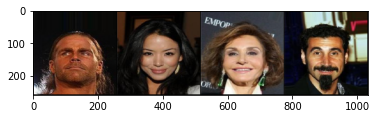

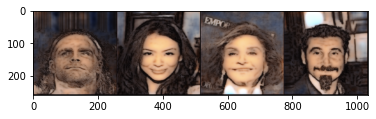

Epoch 10: Step 5200: Generator (U-Net) loss: 20.816516666412337, Discriminator loss: 0.49495758339762697


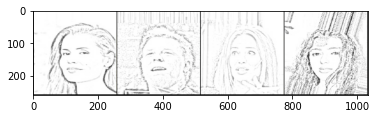

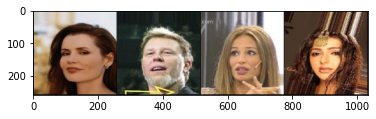

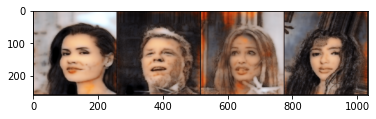

Epoch 10: Step 5400: Generator (U-Net) loss: 20.706982455253595, Discriminator loss: 0.5127943561971188


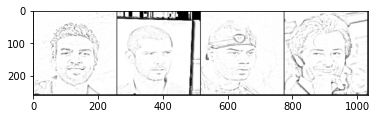

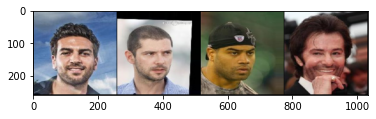

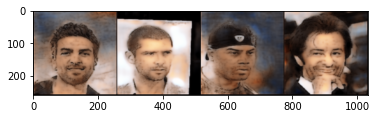

Epoch 11: Step 5600: Generator (U-Net) loss: 20.419597110748292, Discriminator loss: 0.5346736952662465


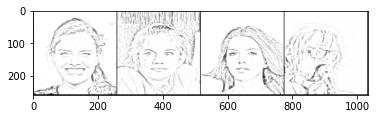

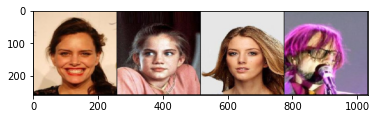

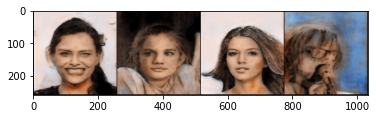

Epoch 11: Step 5800: Generator (U-Net) loss: 20.679578738212577, Discriminator loss: 0.5063563144207001


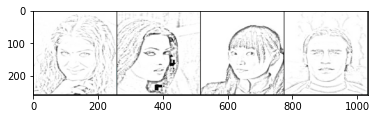

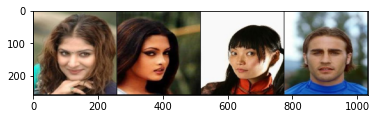

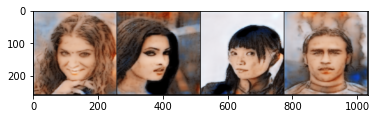

Epoch 12: Step 6000: Generator (U-Net) loss: 20.603791904449455, Discriminator loss: 0.5026532725244758


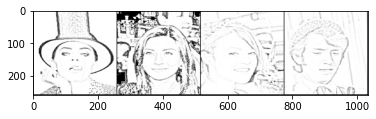

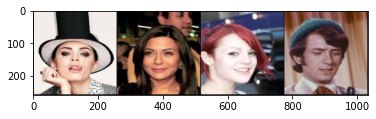

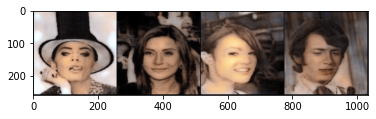

Epoch 12: Step 6200: Generator (U-Net) loss: 20.383223500251777, Discriminator loss: 0.4521570440009238


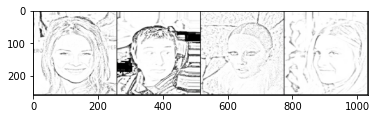

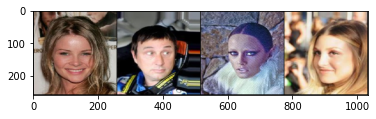

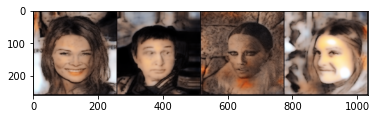

Epoch 12: Step 6400: Generator (U-Net) loss: 20.772695875167855, Discriminator loss: 0.37635720081627355


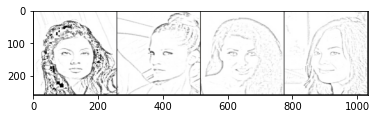

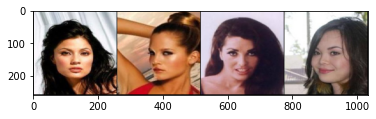

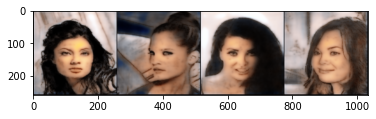

Epoch 13: Step 6600: Generator (U-Net) loss: 21.786251301765454, Discriminator loss: 0.26422667710110537


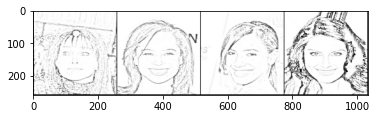

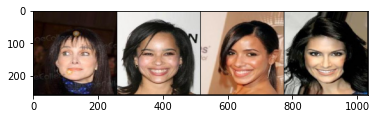

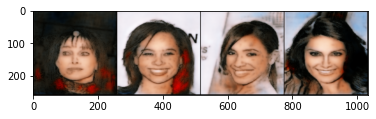

Epoch 13: Step 6800: Generator (U-Net) loss: 21.62567989826204, Discriminator loss: 0.27404006231576195


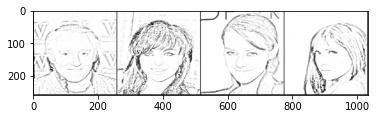

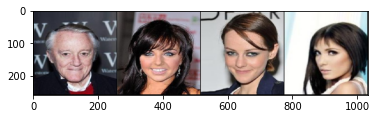

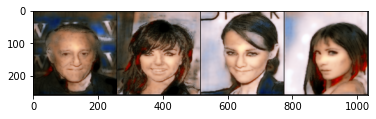

Epoch 14: Step 7000: Generator (U-Net) loss: 22.356826124191286, Discriminator loss: 0.13112027127295725


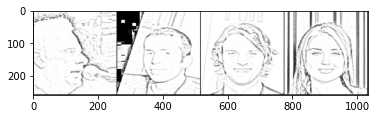

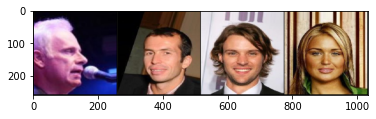

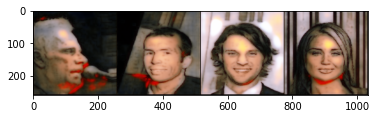

Epoch 14: Step 7200: Generator (U-Net) loss: 22.74918000221252, Discriminator loss: 0.1488371910713612


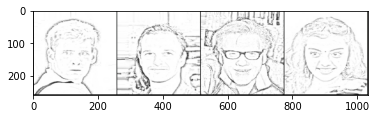

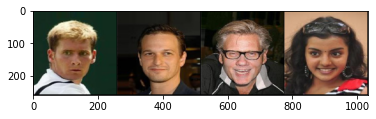

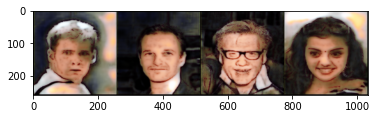

Epoch 14: Step 7400: Generator (U-Net) loss: 21.132610979080205, Discriminator loss: 0.5165891550015659


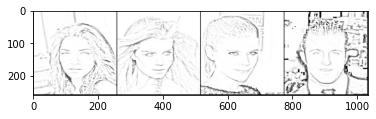

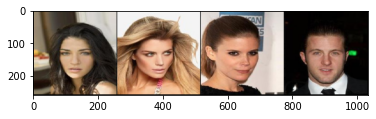

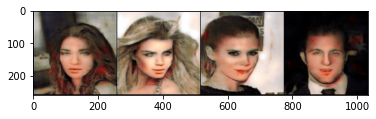

Epoch 15: Step 7600: Generator (U-Net) loss: 20.0786715888977, Discriminator loss: 0.6092787107080224


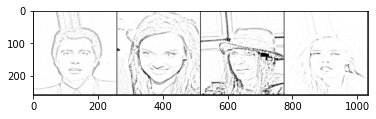

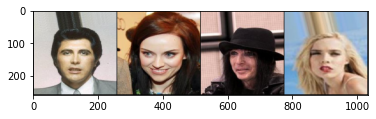

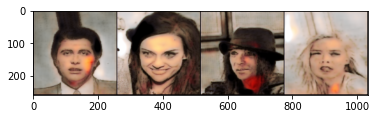

Epoch 15: Step 7800: Generator (U-Net) loss: 20.122545719146718, Discriminator loss: 0.54275984197855


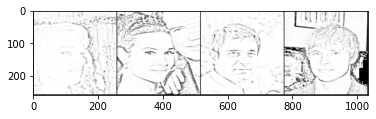

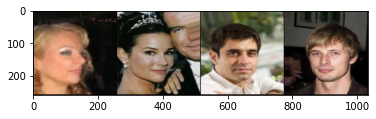

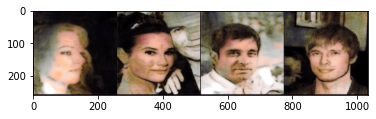

Epoch 16: Step 8000: Generator (U-Net) loss: 20.242327914237965, Discriminator loss: 0.5168289033323529


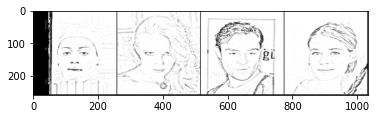

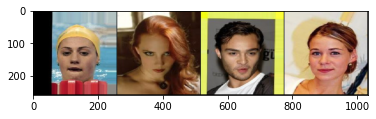

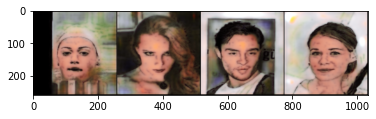

Epoch 16: Step 8200: Generator (U-Net) loss: 20.412956590652463, Discriminator loss: 0.518308135047555


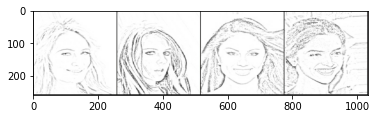

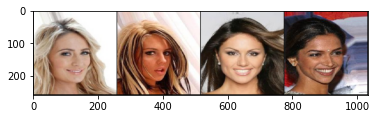

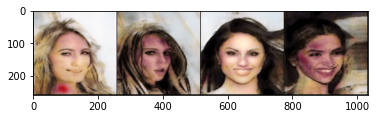

Epoch 16: Step 8400: Generator (U-Net) loss: 19.76948716163636, Discriminator loss: 0.5130263268575073


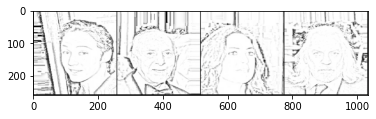

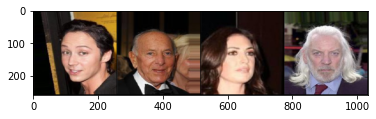

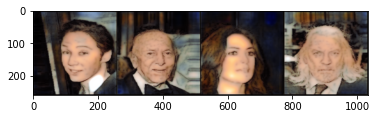

Epoch 17: Step 8600: Generator (U-Net) loss: 19.92873670578002, Discriminator loss: 0.5672033068537714


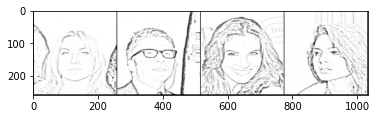

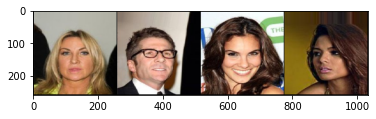

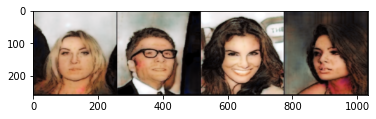

Epoch 17: Step 8800: Generator (U-Net) loss: 19.794489283561713, Discriminator loss: 0.5325420765578746


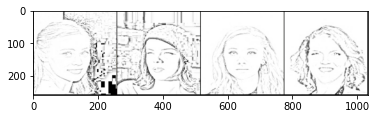

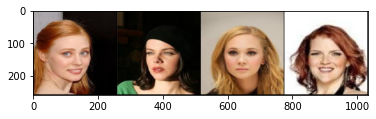

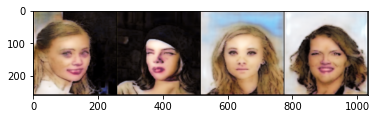

Epoch 18: Step 9000: Generator (U-Net) loss: 19.55572184562683, Discriminator loss: 0.5558950694650411


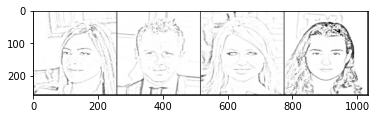

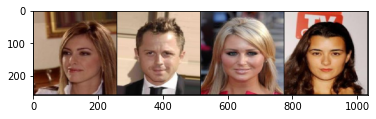

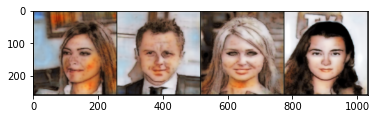

Epoch 18: Step 9200: Generator (U-Net) loss: 19.865939607620234, Discriminator loss: 0.5352723062783479


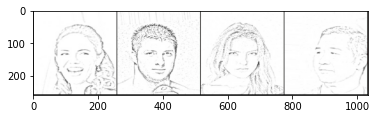

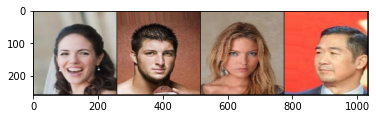

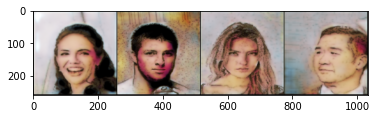

Epoch 18: Step 9400: Generator (U-Net) loss: 19.75392002105712, Discriminator loss: 0.5414574900269504


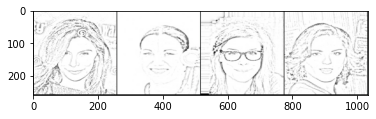

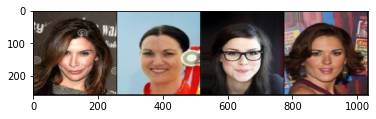

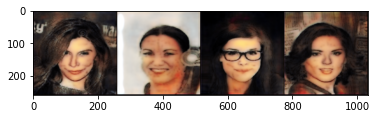

Epoch 19: Step 9600: Generator (U-Net) loss: 19.403316712379457, Discriminator loss: 0.5342318532615897


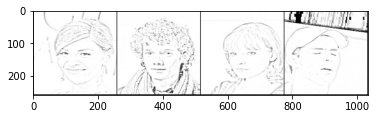

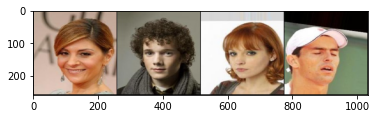

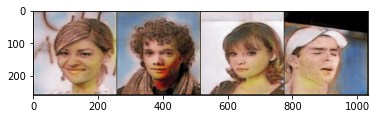

Epoch 19: Step 9800: Generator (U-Net) loss: 19.424033336639408, Discriminator loss: 0.5020080696046351


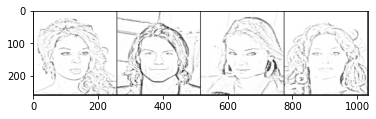

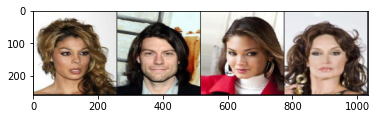

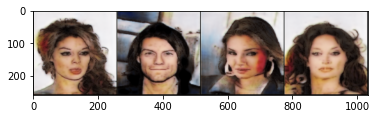

Epoch 20: Step 10000: Generator (U-Net) loss: 19.487999997138974, Discriminator loss: 0.5330203558504581


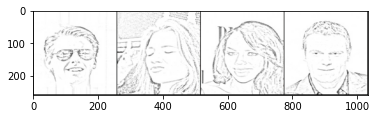

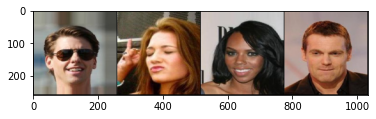

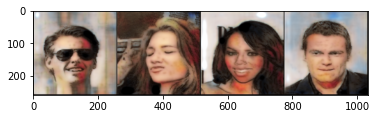

Epoch 20: Step 10200: Generator (U-Net) loss: 18.9181943321228, Discriminator loss: 0.5001935993134976


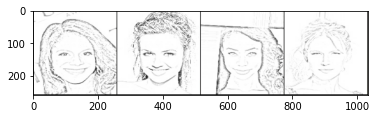

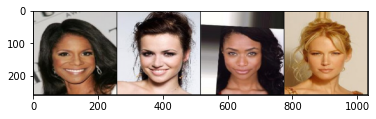

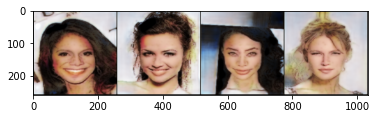

Epoch 20: Step 10400: Generator (U-Net) loss: 19.404293560981753, Discriminator loss: 0.5097494349628686


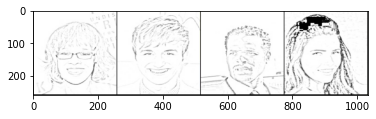

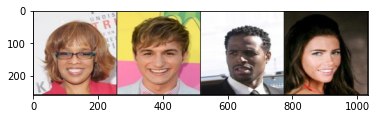

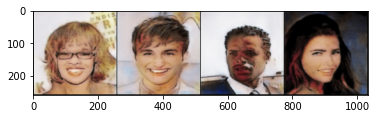

Epoch 21: Step 10600: Generator (U-Net) loss: 19.028459701538093, Discriminator loss: 0.5086658443510534


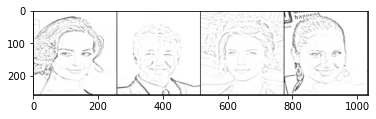

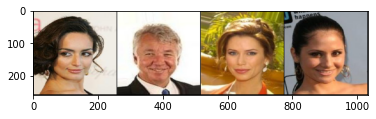

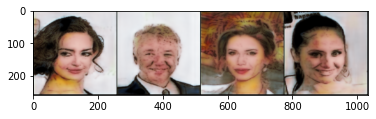

Epoch 21: Step 10800: Generator (U-Net) loss: 19.29872869491577, Discriminator loss: 0.4740596183389425


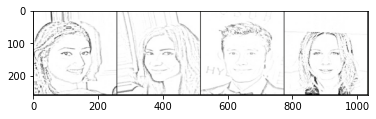

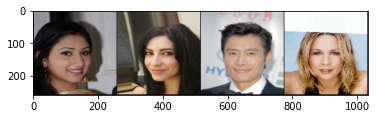

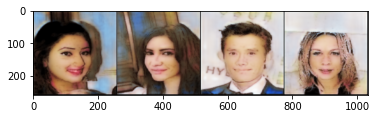

Epoch 22: Step 11000: Generator (U-Net) loss: 19.35514984607697, Discriminator loss: 0.5049392729252576


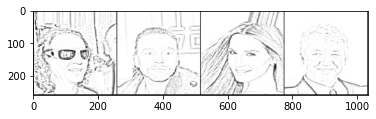

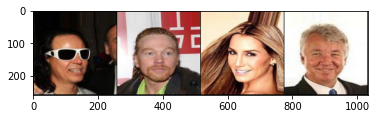

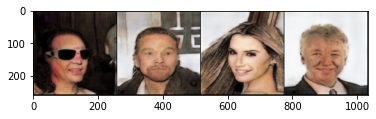

Epoch 22: Step 11200: Generator (U-Net) loss: 19.211281366348278, Discriminator loss: 0.4671902132779361


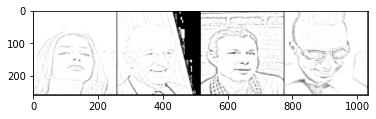

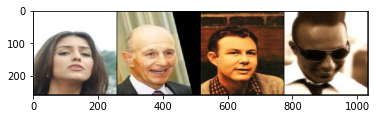

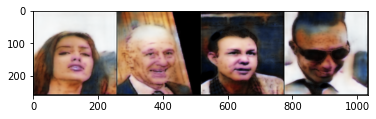

Epoch 22: Step 11400: Generator (U-Net) loss: 18.87290148258209, Discriminator loss: 0.5084610323607923


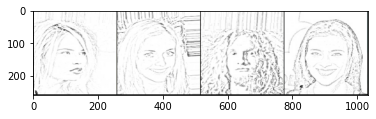

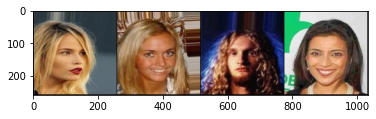

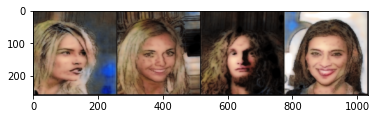

Epoch 23: Step 11600: Generator (U-Net) loss: 18.66774642467497, Discriminator loss: 0.5115902493521574


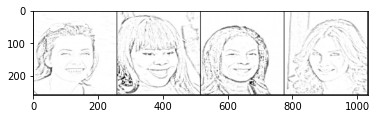

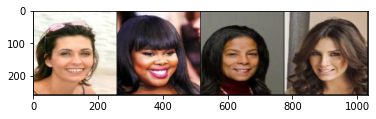

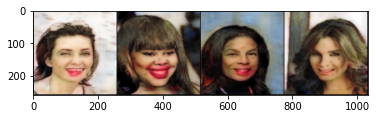

Epoch 23: Step 11800: Generator (U-Net) loss: 18.8878476715088, Discriminator loss: 0.5023075535893442


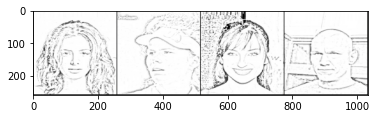

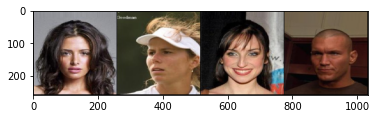

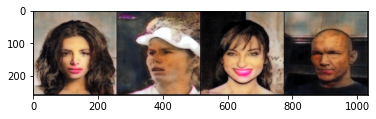

Epoch 24: Step 12000: Generator (U-Net) loss: 18.64985527038574, Discriminator loss: 0.5226877261698244


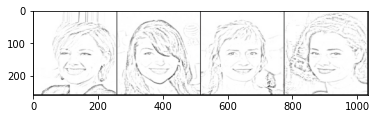

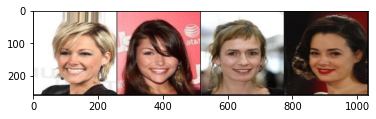

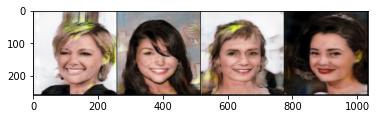

Epoch 24: Step 12200: Generator (U-Net) loss: 18.28860771179199, Discriminator loss: 0.47393751233816156


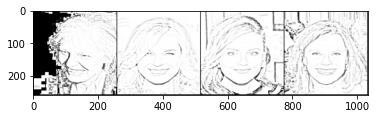

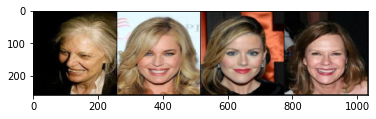

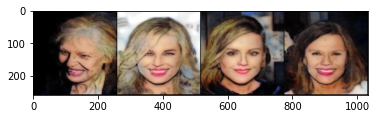

Epoch 24: Step 12400: Generator (U-Net) loss: 18.65912436008453, Discriminator loss: 0.5268348374962806


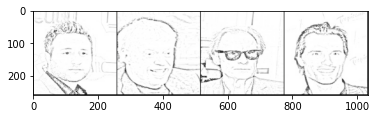

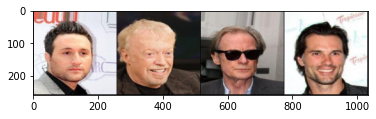

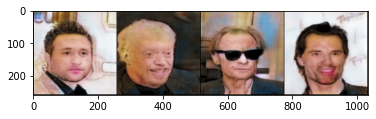

Epoch 25: Step 12600: Generator (U-Net) loss: 18.608652949333187, Discriminator loss: 0.4855254007130861


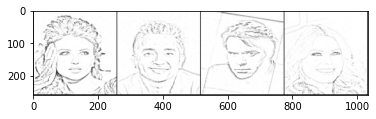

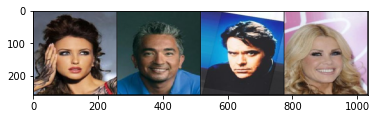

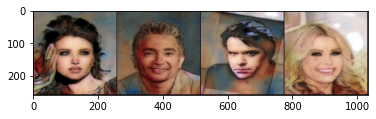

Epoch 25: Step 12800: Generator (U-Net) loss: 18.846546463966366, Discriminator loss: 0.5059806143492461


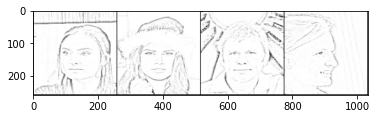

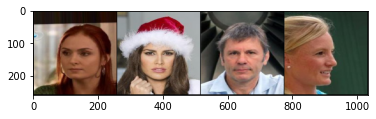

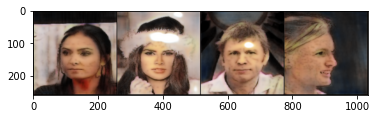

Epoch 26: Step 13000: Generator (U-Net) loss: 18.599678139686596, Discriminator loss: 0.472566995508969


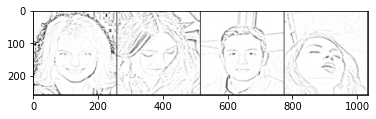

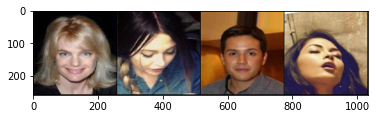

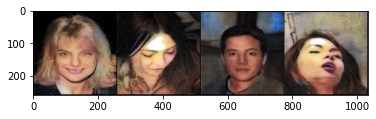

Epoch 26: Step 13200: Generator (U-Net) loss: 18.668549237251277, Discriminator loss: 0.5295696410909292


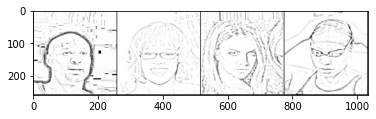

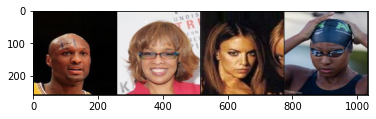

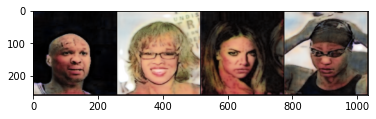

Epoch 26: Step 13400: Generator (U-Net) loss: 18.742416749000565, Discriminator loss: 0.46705417994409815


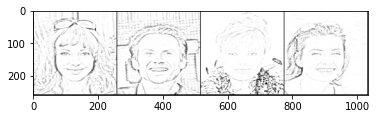

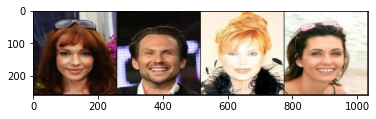

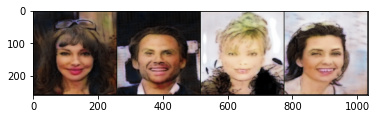

Epoch 27: Step 13600: Generator (U-Net) loss: 18.211189589500425, Discriminator loss: 0.5032398772239685


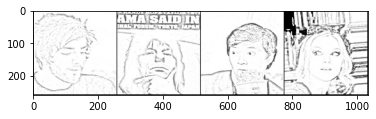

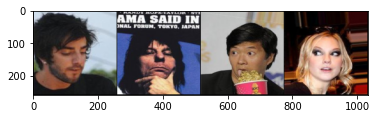

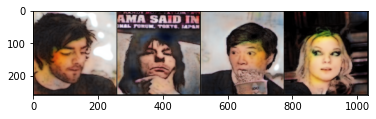

Epoch 27: Step 13800: Generator (U-Net) loss: 18.029425144195553, Discriminator loss: 0.5521093382686381


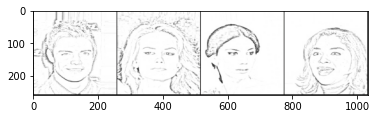

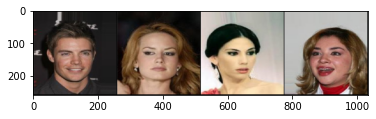

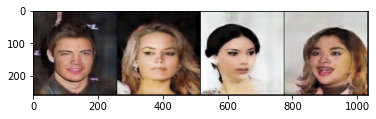

Epoch 28: Step 14000: Generator (U-Net) loss: 17.9005215024948, Discriminator loss: 0.5085859028995036


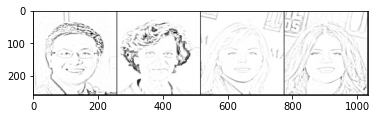

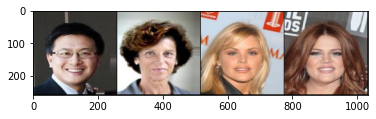

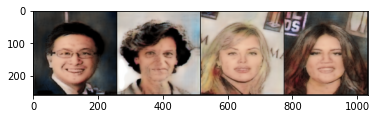

Epoch 28: Step 14200: Generator (U-Net) loss: 18.228029208183294, Discriminator loss: 0.46789731319993727


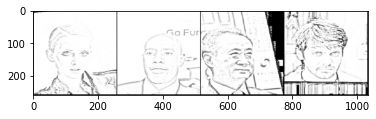

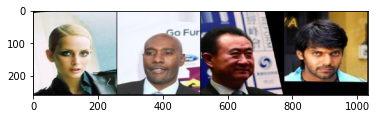

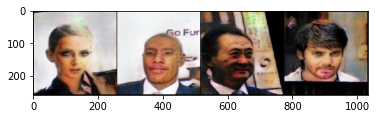

Epoch 28: Step 14400: Generator (U-Net) loss: 18.067990794181817, Discriminator loss: 0.4802672525495292


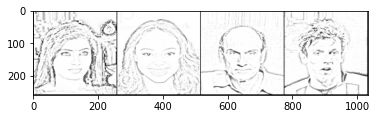

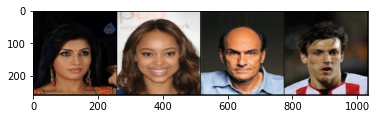

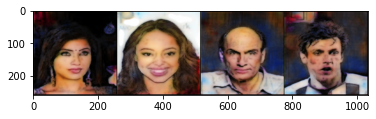

Epoch 29: Step 14600: Generator (U-Net) loss: 18.135778450965883, Discriminator loss: 0.4912567378953096


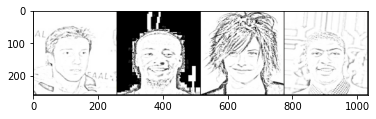

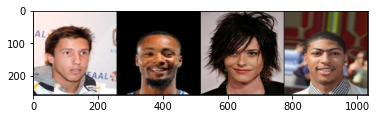

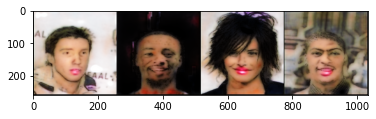

Epoch 29: Step 14800: Generator (U-Net) loss: 18.134695267677294, Discriminator loss: 0.5393968204036352


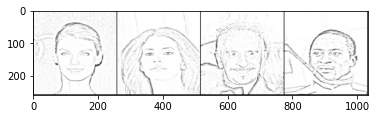

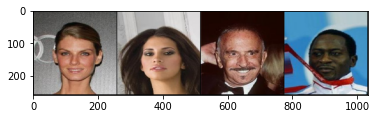

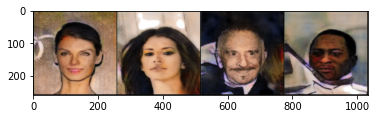

Epoch 30: Step 15000: Generator (U-Net) loss: 17.477141294479363, Discriminator loss: 0.4906119372695686


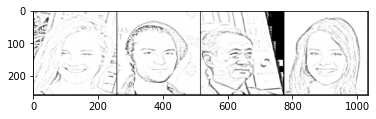

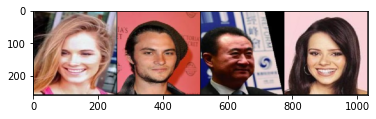

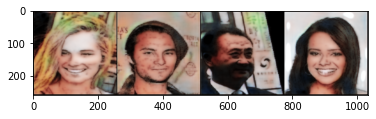

Epoch 30: Step 15200: Generator (U-Net) loss: 18.037758178710934, Discriminator loss: 0.47477141238749027


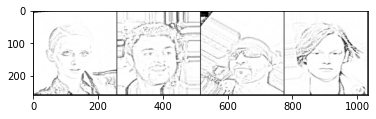

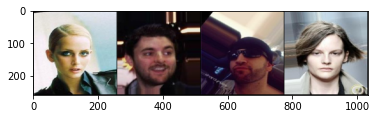

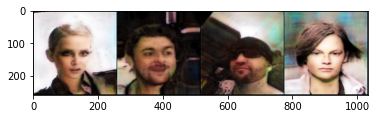

Epoch 30: Step 15400: Generator (U-Net) loss: 17.893925008773817, Discriminator loss: 0.4840402894094586


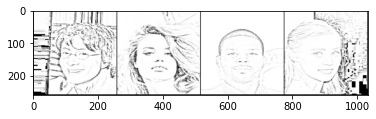

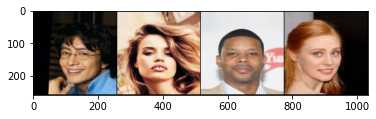

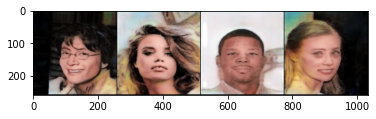

Epoch 31: Step 15600: Generator (U-Net) loss: 17.952717928886408, Discriminator loss: 0.5262008989602328


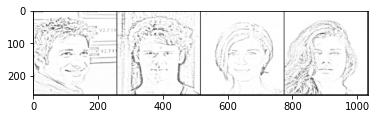

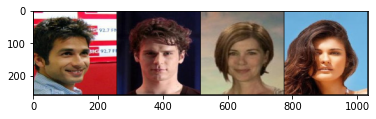

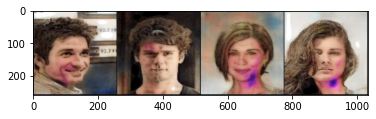

Epoch 31: Step 15800: Generator (U-Net) loss: 17.43025532722474, Discriminator loss: 0.5208817933872338


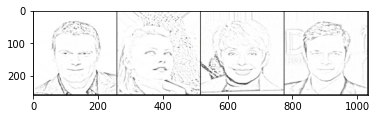

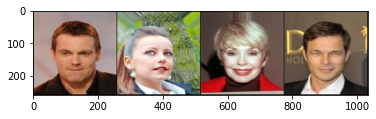

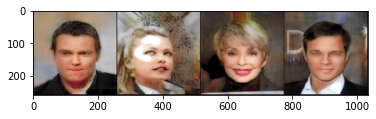

Epoch 32: Step 16000: Generator (U-Net) loss: 17.640779919624332, Discriminator loss: 0.5310622319951649


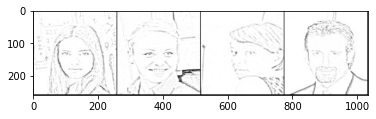

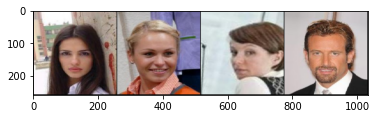

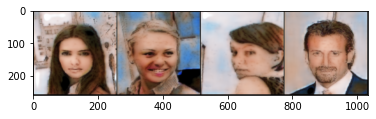

Epoch 32: Step 16200: Generator (U-Net) loss: 17.601638998985297, Discriminator loss: 0.5041053004935386


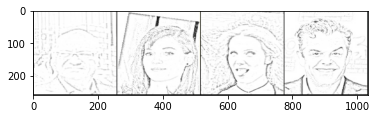

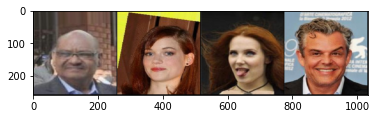

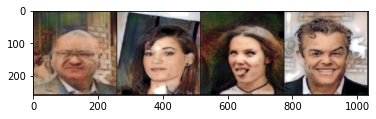

Epoch 32: Step 16400: Generator (U-Net) loss: 17.50650757312774, Discriminator loss: 0.48075490765273593


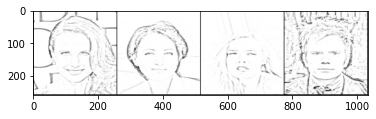

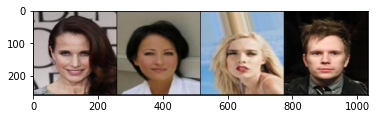

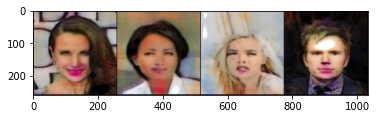

Epoch 33: Step 16600: Generator (U-Net) loss: 17.906069698333734, Discriminator loss: 0.5064160604402422


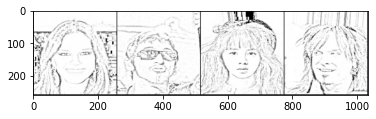

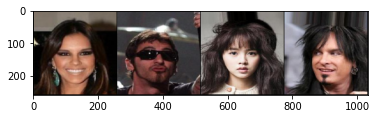

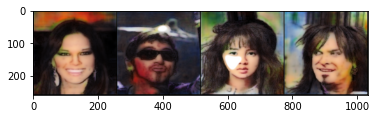

Epoch 33: Step 16800: Generator (U-Net) loss: 17.63777528762817, Discriminator loss: 0.45363577060401467


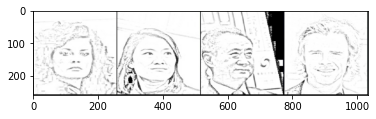

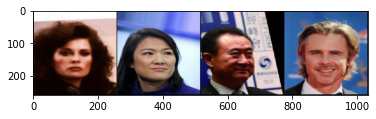

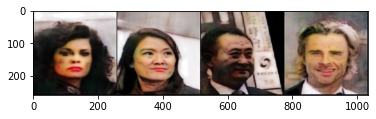

Epoch 34: Step 17000: Generator (U-Net) loss: 17.455081691741942, Discriminator loss: 0.5028881773352625


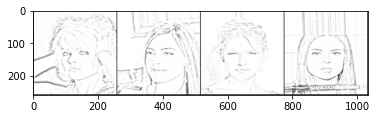

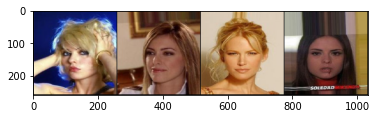

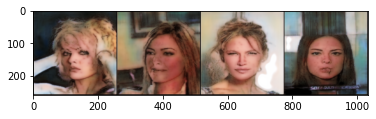

Epoch 34: Step 17200: Generator (U-Net) loss: 17.28537045478821, Discriminator loss: 0.4900740022584798


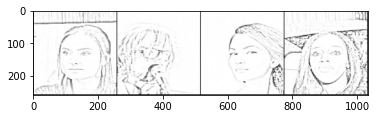

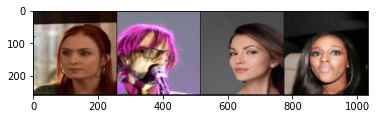

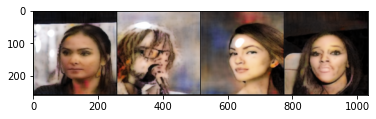

Epoch 34: Step 17400: Generator (U-Net) loss: 17.78440976619721, Discriminator loss: 0.48073263864964233


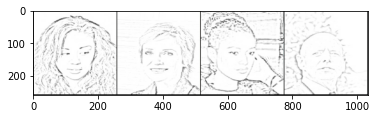

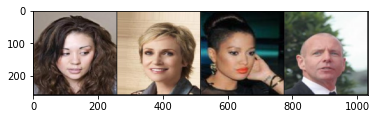

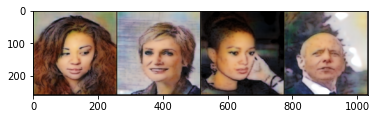

Epoch 35: Step 17600: Generator (U-Net) loss: 17.51565340042115, Discriminator loss: 0.49906636048108355


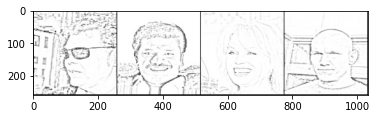

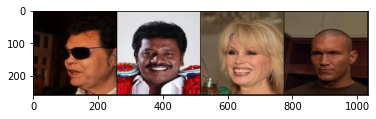

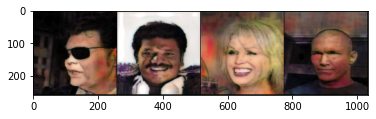

Epoch 35: Step 17800: Generator (U-Net) loss: 17.491429686546326, Discriminator loss: 0.4990500186383727


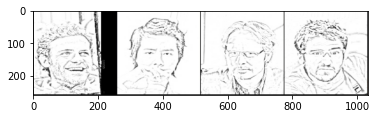

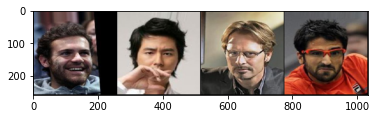

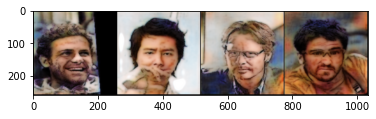

Epoch 36: Step 18000: Generator (U-Net) loss: 17.33926085948944, Discriminator loss: 0.5224784615263345


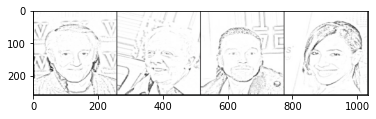

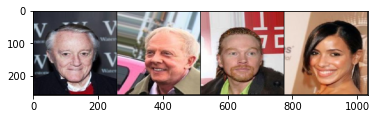

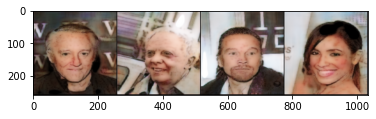

Epoch 36: Step 18200: Generator (U-Net) loss: 17.412634963989273, Discriminator loss: 0.5090468438714745


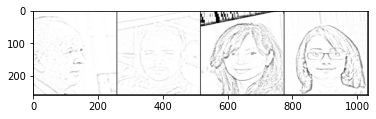

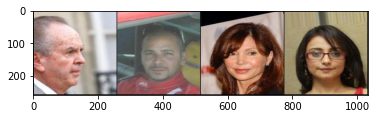

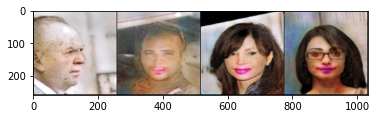

Epoch 36: Step 18400: Generator (U-Net) loss: 17.382683882713312, Discriminator loss: 0.46441648900508875


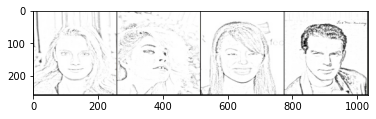

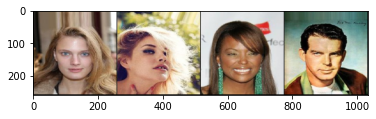

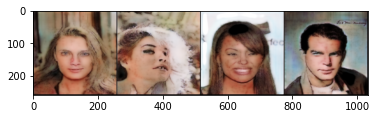

Epoch 37: Step 18600: Generator (U-Net) loss: 17.18715266704559, Discriminator loss: 0.47788068860769284


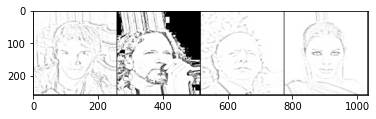

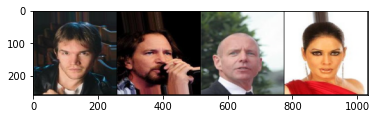

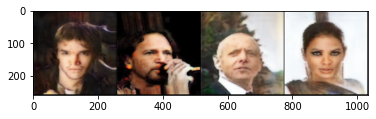

Epoch 37: Step 18800: Generator (U-Net) loss: 17.39970847129821, Discriminator loss: 0.4591091709584001


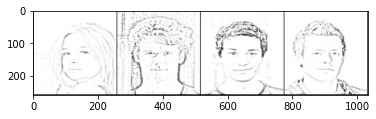

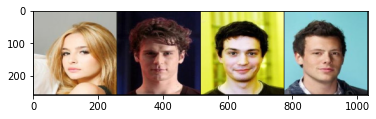

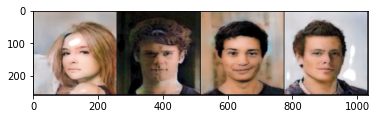

Epoch 38: Step 19000: Generator (U-Net) loss: 16.558556461334238, Discriminator loss: 0.5611205765604973


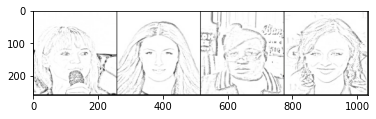

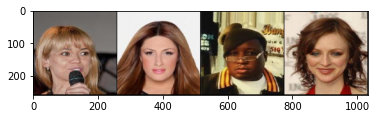

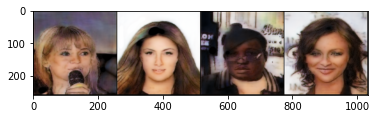

Buffered data was truncated after reaching the output size limit.

In [16]:
from skimage import color
import numpy as np

def train(save_model=True):
    mean_generator_loss = 0
    mean_discriminator_loss = 0
#     dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
    dataloader = load_data_sets(IMAGE_PATH,batch_size=batch_size)
    cur_step = 0

    for epoch in range(n_epochs):
        # Dataloader returns the batches
        for image, _ in tqdm(dataloader):
            image_width = image.shape[3]
            condition = image[:, :, :, :image_width // 2]
            condition = nn.functional.interpolate(condition, size=target_shape)
            real = image[:, :, :, image_width // 2:]
            real = nn.functional.interpolate(real, size=target_shape)
            cur_batch_size = len(condition)
            condition = condition.to(device)
            real = real.to(device)

            ### Update discriminator ###
            disc_opt.zero_grad() # Zero out the gradient before backpropagation
            with torch.no_grad():
                fake = gen(condition)
            disc_fake_hat = disc(fake.detach(), condition) # Detach generator
            disc_fake_loss = adv_criterion(disc_fake_hat, torch.zeros_like(disc_fake_hat))
            disc_real_hat = disc(real, condition)
            disc_real_loss = adv_criterion(disc_real_hat, torch.ones_like(disc_real_hat))
            disc_loss = (disc_fake_loss + disc_real_loss) / 2
            disc_loss.backward(retain_graph=True) # Update gradients
            disc_opt.step() # Update optimizer

            ### Update generator ###
            gen_opt.zero_grad()
            gen_loss = get_gen_loss(gen, disc, real, condition, adv_criterion, recon_criterion, lambda_recon)
            gen_loss.backward() # Update gradients
            gen_opt.step() # Update optimizer

            # Keep track of the average discriminator loss
            mean_discriminator_loss += disc_loss.item() / display_step
            # Keep track of the average generator loss
            mean_generator_loss += gen_loss.item() / display_step

            ### Visualization code ###
            if cur_step % display_step == 0:
                if cur_step > 0:
                    print(f"Epoch {epoch}: Step {cur_step}: Generator (U-Net) loss: {mean_generator_loss}, Discriminator loss: {mean_discriminator_loss}")
                else:
                    print("Pretrained initial state")
                #if(epoch % 5 == 0):
                show_tensor_images(condition, size=(input_dim, target_shape, target_shape))
                show_tensor_images(real, size=(real_dim, target_shape, target_shape))
                show_tensor_images(fake, size=(real_dim, target_shape, target_shape))
                losses_g.append(mean_generator_loss)
                losses_d.append(mean_discriminator_loss)
                mean_generator_loss = 0
                mean_discriminator_loss = 0
                # You can change save_model to True if you'd like to save the model
                if save_model and cur_step > 14000:
                    model_save_name = f'pix2pix_{cur_step}.pth'
                    path = F"/content/gdrive/My Drive/PIX2PIX DATA/{model_save_name}" 
                    torch.save({'gen': gen.state_dict(),
                        'gen_opt': gen_opt.state_dict(),
                        'disc': disc.state_dict(),
                        'disc_opt': disc_opt.state_dict()
                    }, path)
            cur_step += 1
            
train()

In [18]:
# plot and save the generator and discriminator loss
matplotlib.style.use('ggplot')
plt.figure()
plt.plot(losses_g, label='Generator loss')
plt.plot(losses_d, label='Discriminator Loss')
plt.legend()
images_dir = '/content/gdrive/My Drive/PIX2PIX DATA'
plt.savefig(f"{images_dir}/loss_plot.png")

IndentationError: ignored